In [49]:
setwd('/gpfs/ysm/pi/zhao-data/wd262/new_cytof/CyTOF_classification')
source('./Opt/preparation.R')
library(Seurat)
library(ggplot2)
library(cowplot)

In [112]:
A0 <- read.csv('/gpfs/ysm/pi/zhao-data/wd262/new_cytof/CyTOF_classification/write/matrix_A0/A0_covid_Rodrigeuz.csv',header =T, row.names=1)
metadata <- read.csv("/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/meta_data.csv",row.names = 1)
seur_files <- list.files(path = '/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0', pattern='*seur*', full=T, ignore.case = TRUE)
rst_files <- list.files(path = '/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0', pattern='*rst*', full=T, ignore.case = TRUE)

In [3]:
seur_files

[1] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-10_20200408.rds"  
 [2] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-11_20200408.rds"  
 [3] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-12_20200409.rds"  
 [4] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-13_20200408.rds"  
 [5] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-14_20200408.rds"  
 [6] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-15_20200408.rds"  
 [7] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-16_20200408.rds"  
 [8] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-17_20200408.rds"  
 [9] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-18_20200409.rds"  
[10] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-19_20200409.rds"  
[11] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-20_20200409.rds"  
[12] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-21_20200409.rds"  
[13] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-22_20200409.rds"  
[14] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-23_20200409.rds"  
[15] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-24_20200412.rds"  
[16] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-24_20200413.rds"  
[17] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-24_20200415.rds"  
[18] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-26_20200414.rds"  
[19] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-26_20200415.rds"  
[20] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-26_20200416.rds"  
[21] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-26_20200417.rds"  
[22] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-26_20200418.rds"  
[23] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-26_20200420.rds"  
[24] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-27_20200415.rds"  
[25] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-27_20200416.rds"  
[26] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-29_20200418.rds"  
[27] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-29_20200419.rds"  
[28] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-29_20200422.rds"  
[29] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-3_20200408.rds"   
[30] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-30_20200422.rds"  
[31] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-31_20200422.rds"  
[32] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-32_20200421.rds"  
[33] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-32_20200427.rds"  
[34] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-32_20200430.rds"  
[35] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-33_20200421.rds"  
[36] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200421.rds"  
[37] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200422.rds"  
[38] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200423.rds"  
[39] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_

In [4]:
rst <- readRDS(rst_files[1])
seur <- readRDS(seur_files[1])
H_est <- data.frame(rst$H)
H_est <- cbind(matrix(colnames(A0),ncol=1),H_est)

In [73]:
A0

,CD8.T,CD4.T,Mem.Treg,Naive.Treg,gdT,Naive.B,Memory.B,Plasmablast,NK,pDC,mDC,Monocyte,Eosinophil,Neutrophil,MAIT,CD16..Basophil,CD16..Basophil.1
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CD3,1,1,1,1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1
IgD,0,0,0,0,0,1,-1,0,0,0,0,0,0,0,0,0,0
CD20,0,0,0,0,0,1,1,-1,-1,-1,-1,-1,0,0,0,0,0
CD4,-1,1,1,1,-1,0,0,0,0,0,0,0,0,0,-1,0,0
CD8a,1,-1,-1,-1,-1,0,0,0,0,0,0,0,0,0,0,0,0
CD11c,0,0,0,0,0,0,0,0,0,1,-1,0,0,0,0,0,0
CD16,0,0,0,0,0,0,0,0,0,-1,-1,0,0,1,0,1,-1
CD14,0,0,0,0,0,0,0,0,-1,-1,-1,1,0,-1,0,0,0
CD45RA,0,0,-1,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [5]:
H_est

"matrix(colnames(A0), ncol = 1)",X1,X2,X3,X4,X5,X6,X7,X8,X9,⋯,X17723,X17724,X17725,X17726,X17727,X17728,X17729,X17730,X17731,X17732
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD8.T,1.735965e-01,8.260760e-02,1.976183e-149,1.030317e-141,5.565444e-22,4.156024e-01,8.751896e-02,1.310977e-01,9.061506e-02,⋯,3.393824e-12,7.951267e-02,8.510246e-02,2.000992e-02,2.319232e-01,4.900280e-01,2.522447e-25,4.194305e-02,2.255331e-02,1.963142e-01
CD4.T,1.828352e-02,4.411146e-81,9.073413e-82,5.684199e-104,1.631377e-05,6.529485e-86,3.638843e-14,8.775246e-110,3.026862e-99,⋯,2.008315e-03,1.889830e-131,8.979399e-40,1.493917e-63,3.610455e-119,8.729725e-02,5.255889e-14,1.106608e-01,1.006067e-06,1.536083e-33
Mem.Treg,5.124827e-02,3.846694e-74,8.493113e-86,4.283226e-72,5.946997e-11,9.618591e-58,8.490097e-30,8.497777e-114,1.363920e-103,⋯,1.619257e-02,2.073209e-117,4.015194e-05,5.955447e-101,1.652881e-139,1.194981e-01,8.494695e-13,1.701249e-01,4.964444e-03,3.768582e-69
Naive.Treg,3.538325e-02,7.080736e-57,2.583205e-149,3.678611e-134,2.161442e-02,5.375885e-01,1.833788e-03,1.640985e-79,1.792131e-70,⋯,1.477159e-02,1.051245e-137,2.353101e-54,2.509042e-01,1.181879e-01,2.665264e-87,1.611203e-15,1.582043e-111,3.824762e-45,1.869003e-30
gdT,4.794874e-01,7.030842e-68,4.858999e-113,9.030195e-111,5.198400e-02,1.698807e-01,9.320096e-04,3.705922e-99,5.019917e-97,⋯,6.805213e-02,1.458454e-138,1.016442e-12,8.876248e-61,2.019637e-101,1.475005e-01,3.421133e-06,1.439885e-19,4.709346e-02,3.428679e-21
Naive.B,6.248537e-03,5.116377e-20,3.363718e-118,4.682158e-83,5.636459e-02,2.488330e-09,1.702565e-02,8.616059e-28,3.787418e-35,⋯,7.535387e-03,8.493188e-60,8.000595e-04,9.770219e-38,4.653734e-06,6.971593e-41,2.815488e-07,3.848093e-40,1.721422e-15,8.823054e-03
Memory.B,6.681440e-33,1.153249e-27,9.835339e-122,1.593665e-77,4.368069e-04,2.856535e-71,1.096770e-02,2.585596e-37,3.417891e-42,⋯,4.205911e-03,7.714203e-70,9.024799e-11,5.012382e-28,3.342325e-20,7.928774e-02,7.299400e-11,1.052777e-101,7.196728e-22,1.642994e-04
Plasmablast,1.369980e-02,1.456889e-01,7.453164e-55,1.586924e-11,1.447617e-03,1.988443e-136,5.065996e-02,7.747843e-62,8.668228e-02,⋯,1.841461e-02,4.503210e-54,1.536643e-26,5.980294e-10,5.895855e-14,1.240003e-73,6.683657e-02,9.795492e-119,1.629665e-02,8.860604e-02
NK,2.055136e-23,1.626780e-02,4.899620e-01,3.631236e-01,1.361172e-27,2.563915e-131,3.371840e-44,8.351779e-07,1.915473e-02,⋯,2.588988e-34,2.784057e-01,8.535557e-02,1.111087e-01,3.171364e-02,1.900388e-94,6.031846e-02,1.216317e-01,1.459712e-01,5.915786e-21


In [111]:
ct_cnt_pred <- ct_cnt_pred_sub <- data.frame(matrix(rep(0,nrow(H_est)),nrow=1,ncol=nrow(H_est)))
colnames(ct_cnt_pred) <- colnames(ct_cnt_pred_sub) <- H_est[,1]
delete.sample <- c()
#acc_subsetting <- c()

for(sample.idx in 1:length(rst_files)){
    rst <- readRDS(rst_files[sample.idx])
    seur <- readRDS(seur_files[sample.idx])

    H_est <- data.frame(rst$H)
    H_est <- cbind(matrix(colnames(A0),ncol=1),H_est)
    celltype_pred <- apply(rst$H, 2, predict_realdata, H = H_est)
    seur@meta.data$pred <- celltype_pred
#     saveRDS(seur, seur_files[sample.idx])
    
    ## subsetting
    H_est_subsetting <- H_est[,-1]
    H_est_subsetting <- apply(H_est_subsetting,2,function(x) x/sum(x))
    if(max(H_est_subsetting)<.2){
        delete.sample <- append(delete.sample,sample.idx)
        
        ct_cnt_pred_sub <- rbind(ct_cnt_pred_sub,rep(0,ncol(ct_cnt_pred_sub)))    
        ct_cnt_pred <- rbind(ct_cnt_pred,rep(0,ncol(ct_cnt_pred_sub)))
    }else{                          

    idx.subsetting = c()
    N.subsetting = 0                          
    for(i in 1:length(seur$pred)){
        if(max(H_est_subsetting[,i])>0.4){
            idx.subsetting = append(idx.subsetting,i)
            N.subsetting = N.subsetting+1
        }

    }
    print(c(sample.idx,N.subsetting,ncol(seur)))                          
              
                              
    # cell type proportions
    seur_sub <- subset(seur, cells=Cells(seur)[idx.subsetting])
    ct_cnt_pred_sub <- rbind(ct_cnt_pred_sub,table(seur_sub$pred)[colnames(ct_cnt_pred_sub)])
    
    ct_cnt_pred <- rbind(ct_cnt_pred,table(seur$pred)[colnames(ct_cnt_pred)])
        
    }                            
}

[1]     1 10230 17732
[1]     3  9298 18259
[1]     4  8057 17275
[1]     5 13680 17600
[1]   6 362 545
[1]    7 6535 9463
[1]     8  7376 17691
[1]     9  3132 17589
[1]    10 16745 17489
[1]    11  2377 17781
[1]    12 16842 17605
[1]    13  8606 17843
[1]    14 14200 14681
[1]    15  2930 17411
[1]    16  5538 17306
[1]    17  9761 16750
[1]    19  8188 17155
[1]    20 11135 16750
[1]    21 12422 16921
[1]    22 12445 16984
[1]    23  9700 17745
[1]    24  6163 17370
[1]    25  5515 17733
[1]    26 13499 14753
[1]   27 2773 2896
[1]    28  2199 15123
[1]   29 1279 2539
[1]    31 11794 14621
[1]    33  1898 15390
[1]    34  3114 15655
[1]    36 15531 15893
[1]    37 15646 16095
[1]    38 11578 17939
[1]    39  1706 16699
[1]    43  1480 16639
[1]    45  1682 16723
[1]    46 15037 16564
[1]    47  9309 16026
[1]    48  3865 18102
[1]    49 12762 17295
[1]    50 10425 16927
[1]    51  8044 18064
[1]    52  2329 17319
[1]    54 11588 15546
[1]    55  8232 11287
[1]    56  3542 17896
[1]

In [113]:
metadata_prop <- metadata
metadata_prop_sub <- metadata
metadata_prop <- cbind(metadata_prop,t(apply(ct_cnt_pred[-1,],1,function(x) x/sum(x))))
metadata_prop_sub <- cbind(metadata_prop_sub,t(apply(ct_cnt_pred_sub[-1,],1,function(x) x/sum(x))))
metadata <- metadata[-delete.sample,]
metadata_prop <- metadata_prop[-delete.sample,]
metadata_prop_sub <- metadata_prop_sub[-delete.sample,]

In [156]:
table(metadata_prop$Subject.ID) > 3

[1] "COV-10" "COV-11" "COV-12" "COV-13" "COV-14" "COV-15" "COV-16" "COV-17"
 [9] "COV-18" "COV-19" "COV-20" "COV-21" "COV-22" "COV-23" "COV-24" "COV-26"
[17] "COV-27" "COV-29" "COV-3"  "COV-30" "COV-31" "COV-32" "COV-33" "COV-34"
[25] "COV-35" "COV-36" "COV-37" "COV-39" "COV-4"  "COV-40" "COV-41" "COV-42"
[33] "COV-43" "COV-5"  "COV-7"  "COV-8"  "COV-9"

In [115]:
metadata_prop

,Subject.ID,Patient_Group,Date,Days_after_First_Day,dir,Days_After_Admission,CD8.T,CD4.T,Mem.Treg,Naive.Treg,⋯,Plasmablast,NK,pDC,mDC,Monocyte,Eosinophil,Neutrophil,MAIT,CD16..Basophil,CD16..Basophil.1
,<fct>,<fct>,<fct>,<int>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
COV-10_20200408,COV-10,Recovery,2020-04-08,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-10_20200408.rds,0,0.0404353711,1.009474e-02,8.290097e-03,0.047653959,⋯,2.171216e-02,0.030904579,0.0210354162,0.0012970900,0.0634446199,0.0759643582,0.502368599,0.0318069028,5.430859e-02,0.0261673810
COV-12_20200409,COV-12,NA,NA,NA,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-12_20200409.rds,NA,0.0326962046,2.409771e-03,9.584315e-03,0.070321485,⋯,6.791171e-03,0.002409771,0.0182923490,0.0451831973,0.0033408182,0.0063530314,0.633002903,0.0459499425,5.641054e-03,0.0947477956
COV-13_20200408,COV-13,Recovery,2020-04-08,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-13_20200408.rds,0,0.0104196816,1.551375e-02,2.720695e-03,0.053024602,⋯,1.117221e-02,0.011924747,0.0031259045,0.0257597685,0.0230969609,0.0147612156,0.027843705,0.0003473227,6.199711e-02,0.0031259045
COV-14_20200408,COV-14,Recovery,2020-04-08,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-14_20200408.rds,0,0.0302840909,1.090909e-02,1.193182e-02,0.073977273,⋯,5.892045e-02,0.046875000,0.0121590909,0.0223863636,0.0480681818,0.0186363636,0.450340909,0.0191477273,3.465909e-02,0.0636363636
COV-15_20200408,COV-15,Recovery,2020-04-08,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-15_20200408.rds,0,0.0018348624,1.834862e-03,0.000000e+00,0.000000000,⋯,3.669725e-03,0.001834862,0.0000000000,0.6256880734,0.3504587156,0.0000000000,0.014678899,0.0000000000,0.000000e+00,0.0000000000
COV-16_20200408,COV-16,Recovery,2020-04-08,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-16_20200408.rds,0,0.0464968826,8.453979e-03,2.198034e-02,0.065201310,⋯,4.744796e-02,0.035189686,0.0262073338,0.0896121737,0.1130719645,0.0546338370,0.296417627,0.0028532178,1.014477e-02,0.1132833140
COV-17_20200408,COV-17,Recovery,2020-04-08,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-17_20200408.rds,0,0.0061047991,4.482505e-02,4.013340e-03,0.034650387,⋯,1.899271e-02,0.018031768,0.0070092137,0.0432988525,0.0017523034,0.1729127805,0.462099373,0.0660787971,1.644904e-02,0.0296195806
COV-18_20200409,COV-18,Recovery,2020-04-09,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-18_20200409.rds,0,0.0225140713,3.667065e-02,3.183808e-03,0.060776622,⋯,3.979760e-03,0.003922906,0.0088123259,0.0073341293,0.0430382626,0.0180794815,0.460628802,0.0113138894,1.080221e-02,0.1495252715
COV-19_20200409,COV-19,Recovery,2020-04-09,0,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-19_20200409.rds,0,0.0000000000,0.000000e+00,0.000000e+00,0.000000000,⋯,0.000000e+00,0.000000000,0.0000000000,0.0642117903,0.0554062554,0.0000000000,0.000000000,0.0000000000,0.000000e+00,0.0026874035


In [121]:
metadata_prop <- metadata_prop[metadata_prop$Patient_Group %in% c('ICU', 'Non-ICU', 'Recovery'),]
metadata_prop_sub <- metadata_prop_sub[metadata_prop_sub$Patient_Group %in% c('ICU', 'Non-ICU', 'Recovery'),]

In [163]:
plt_lst <- list()
for(i in colnames(ct_cnt_pred)) {
   plt_lst[[i]] <- ggplot(metadata_prop, aes_string(x='Patient_Group', y=i)) + 
    geom_boxplot()+ 
    labs(y = 'Proportion', title = i) + 
    theme(axis.text=element_text(size=12),
        axis.title=element_text(size=14,face="bold"),
        plot.title = element_text(size=14))
}
pll <- plot_grid(plotlist = plt_lst, ncol = 4)
title <- ggdraw() + draw_label("Cell type proportion", fontface='bold')
pll <- plot_grid(title, pll, ncol=1, rel_heights=c(0.1, 1)) 
ggsave('/home/bz234/project/Results/CyTOF/covid-Rodrigeuz/cell_type_prop.png', pll, width = 15, height = 20)

In [168]:
plt_lst_sub <- list()
for(i in colnames(ct_cnt_pred_sub)) {
   plt_lst_sub[[i]] <- ggplot(metadata_prop_sub, aes_string(x='Patient_Group', y=i)) + 
    geom_boxplot()+ 
    labs(y = 'Proportion', title = i) +
    theme(axis.text=element_text(size=12),
        axis.title=element_text(size=14,face="bold"),
        plot.title = element_text(size=14))
}
pll_sub <- plot_grid(plotlist = plt_lst_sub, ncol = 4)
title_sub <- ggdraw() + draw_label("Cell type proportion (subsetting)", fontface='bold')
pll_sub <- plot_grid(title_sub, pll_sub, ncol=1, rel_heights=c(0.1, 1)) # rel_heights values control title margins
ggsave('/home/bz234/project/Results/CyTOF/covid-Rodrigeuz/cell_type_prop_sub.png', pll_sub, width = 15, height = 20)

In [145]:
p40_files <- list.files(path = '/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0', pattern=glob2rx('*COV-40*'), full=T, ignore.case = TRUE)
p34_files <- list.files(path = '/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0', pattern=glob2rx('*COV-34*'), full=T, ignore.case = TRUE)
p26_files <- list.files(path = '/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0', pattern=glob2rx('*COV-26*'), full=T, ignore.case = TRUE)
p37_files <- list.files(path = '/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0', pattern=glob2rx('*COV-37*'), full=T, ignore.case = TRUE)
rst_40_files <- intersect(rst_files,p40_files)
rst_34_files <- intersect(rst_files,p34_files)
rst_26_files <- intersect(rst_files,p26_files)
rst_37_files <- intersect(rst_files,p37_files)
seur_40_files <- intersect(seur_files,p40_files)
seur_34_files <- intersect(seur_files,p34_files)
seur_26_files <- intersect(seur_files,p26_files)
seur_37_files <- intersect(seur_files,p37_files)

In [148]:
rst_34_files
seur_34_files

[1] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200421.rds"  
 [2] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200422.rds"  
 [3] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200423.rds"  
 [4] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200424_1.rds"
 [5] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200424_2.rds"
 [6] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200426.rds"  
 [7] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200428.rds"  
 [8] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200430.rds"  
 [9] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200501.rds"  
[10] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200502.rds"  
[11] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200504.rds"  
[12] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/rst_COV-34_20200506.rds"

[1] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200421.rds"  
 [2] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200422.rds"  
 [3] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200423.rds"  
 [4] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200424_1.rds"
 [5] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200424_2.rds"
 [6] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200426.rds"  
 [7] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200428.rds"  
 [8] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200430.rds"  
 [9] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200501.rds"  
[10] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200502.rds"  
[11] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200504.rds"  
[12] "/gpfs/ysm/pi/zhao-data/wd262/new_cytof/write/covid_Rodriguez/only_A0/seur_COV-34_20200506.rds"

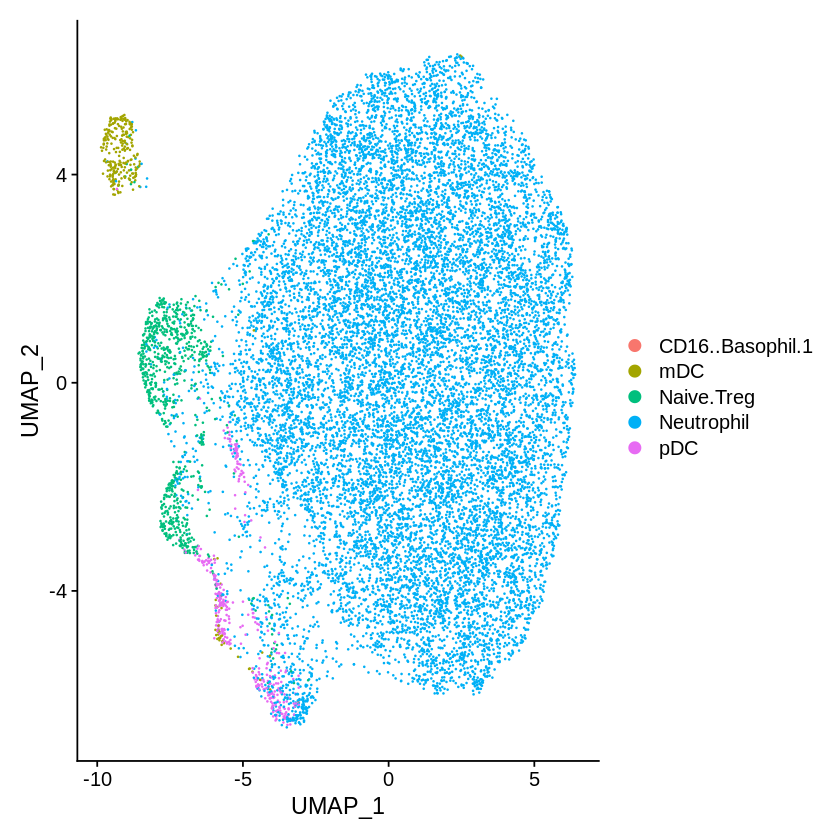

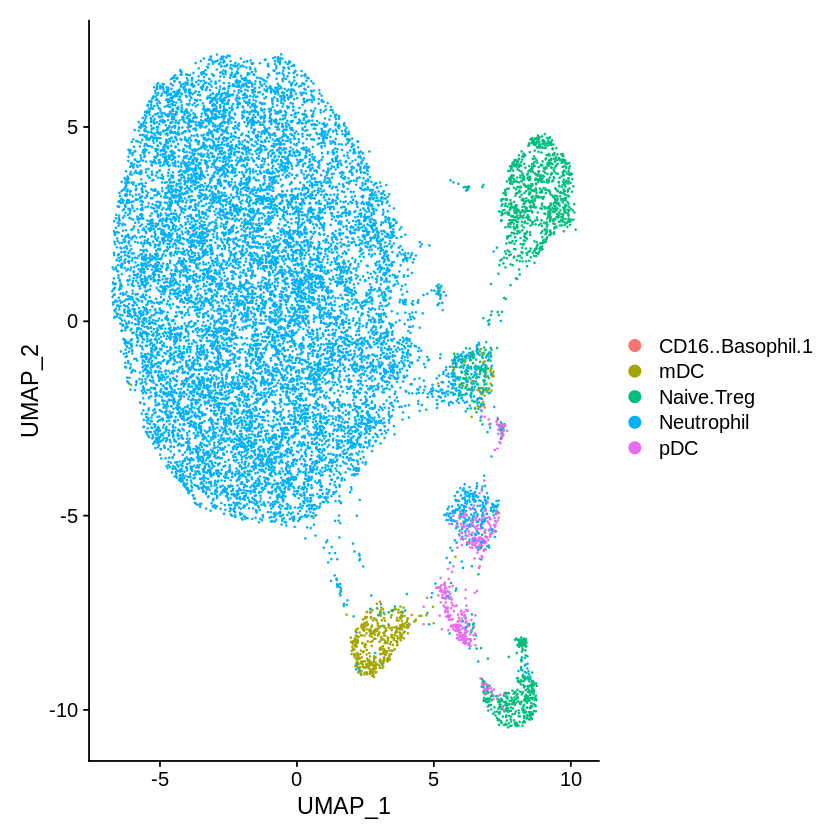

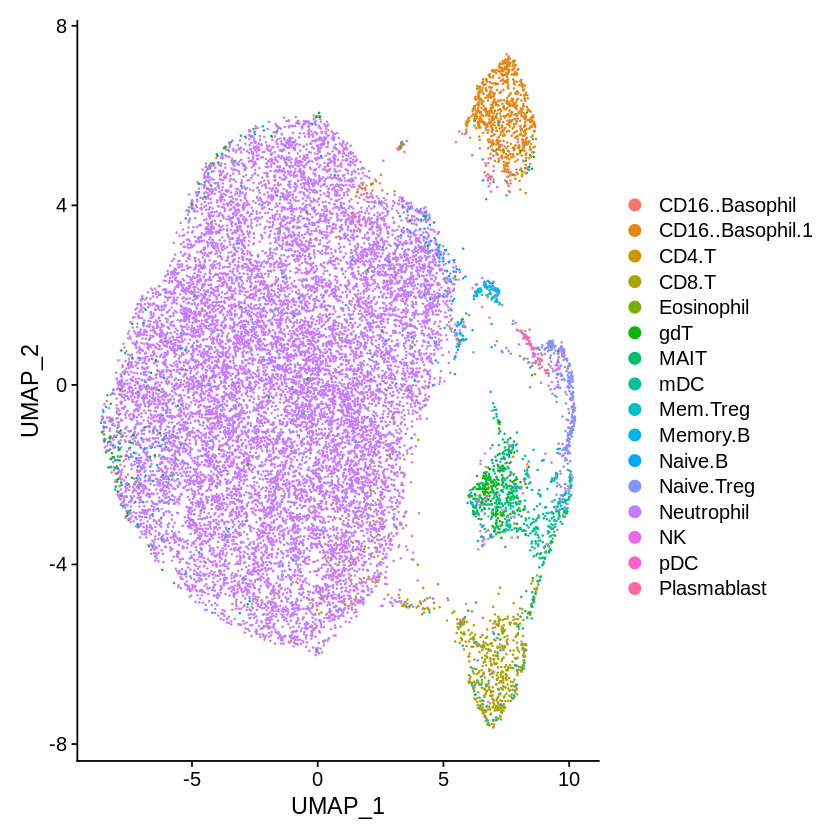

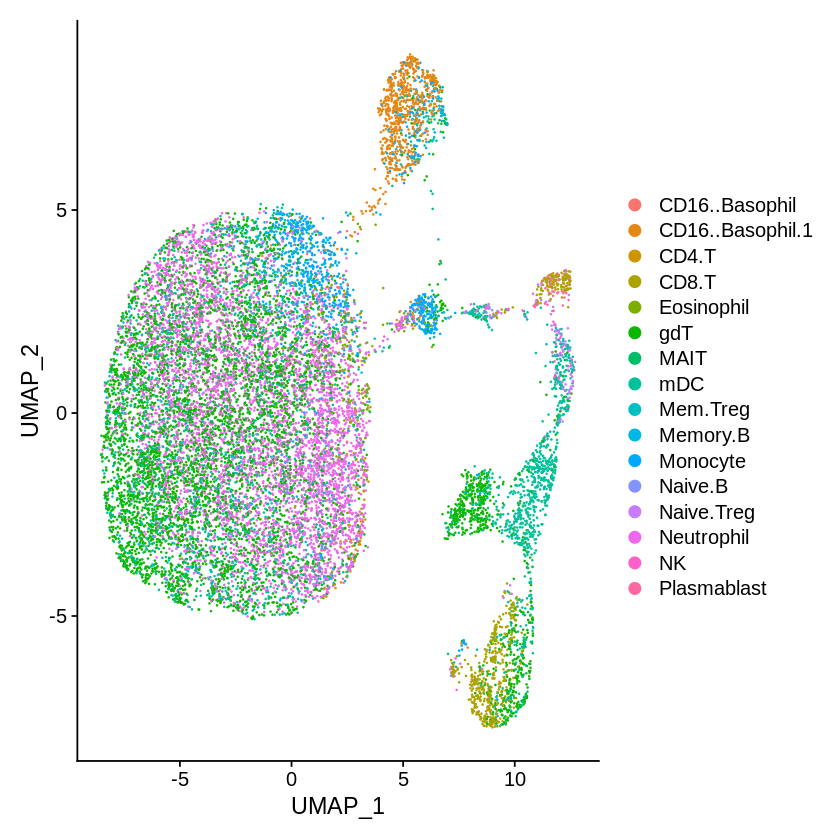

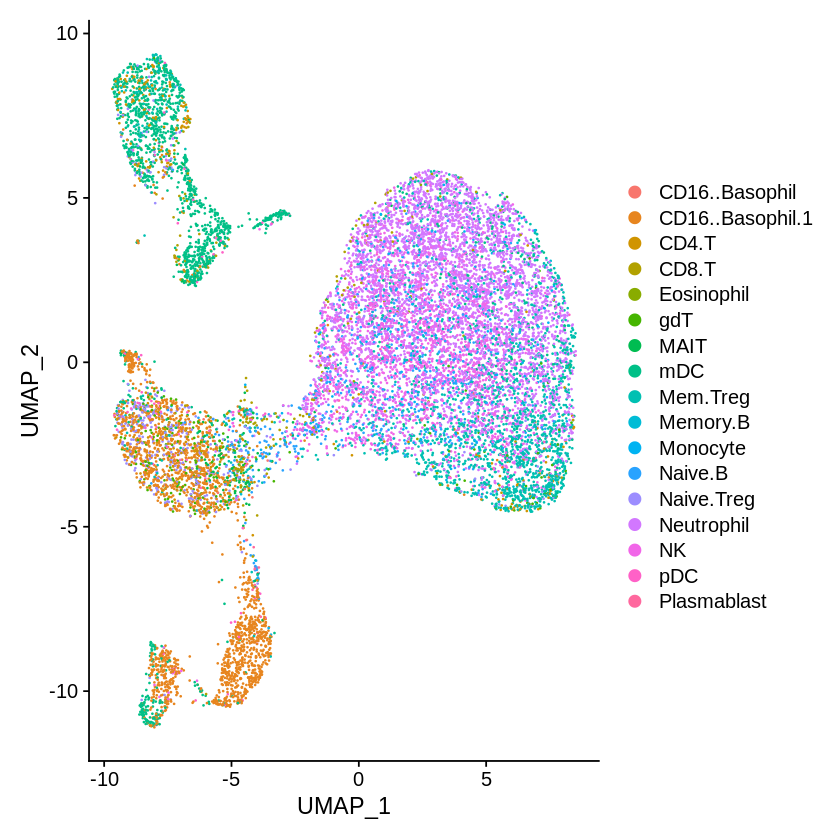

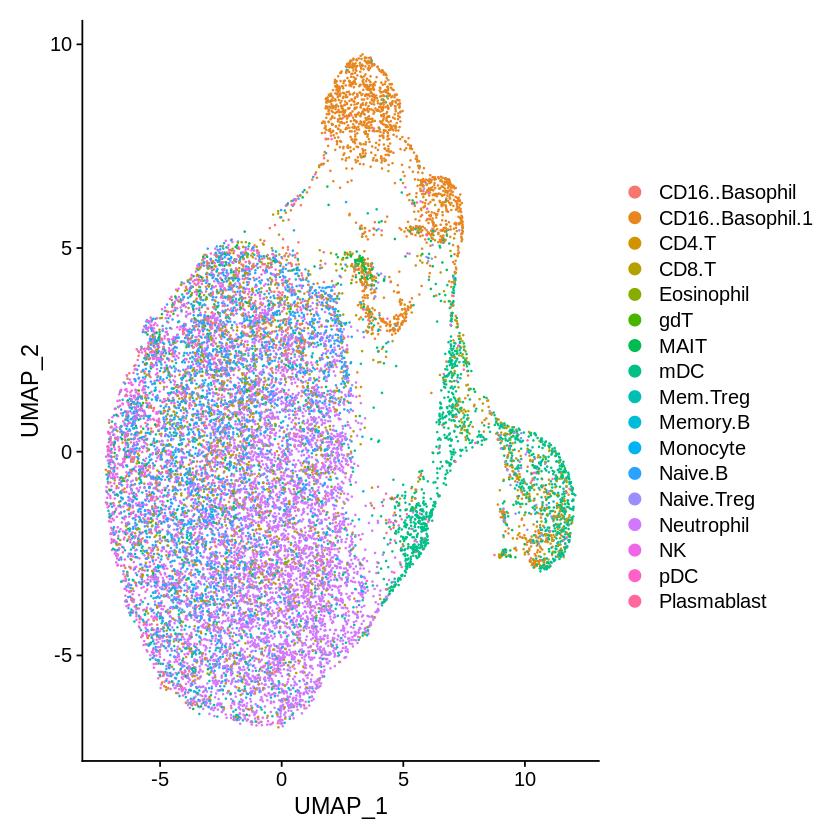

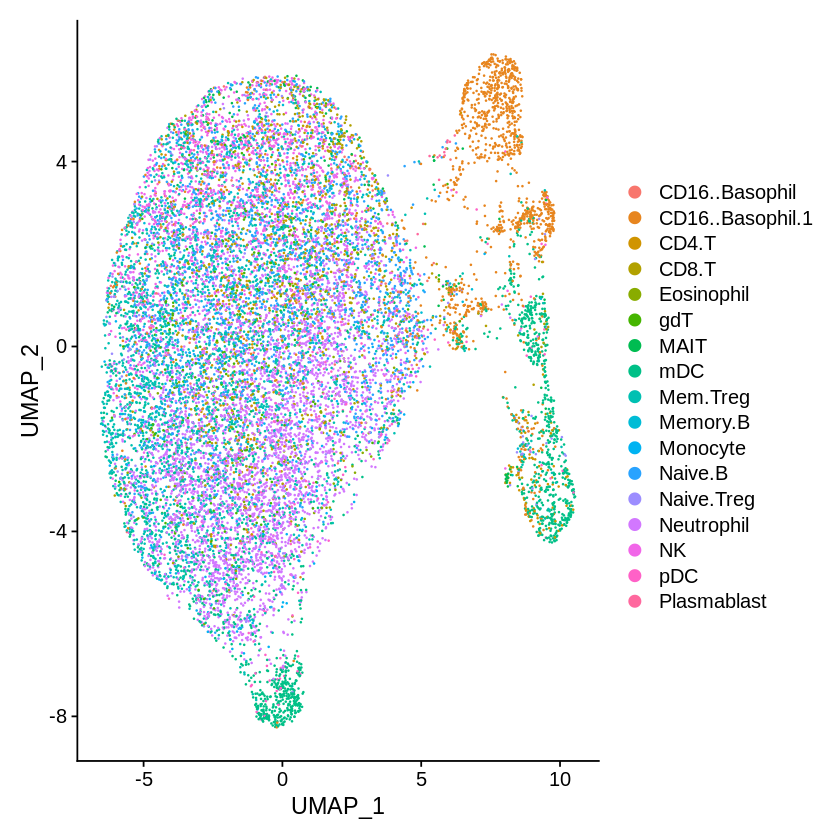

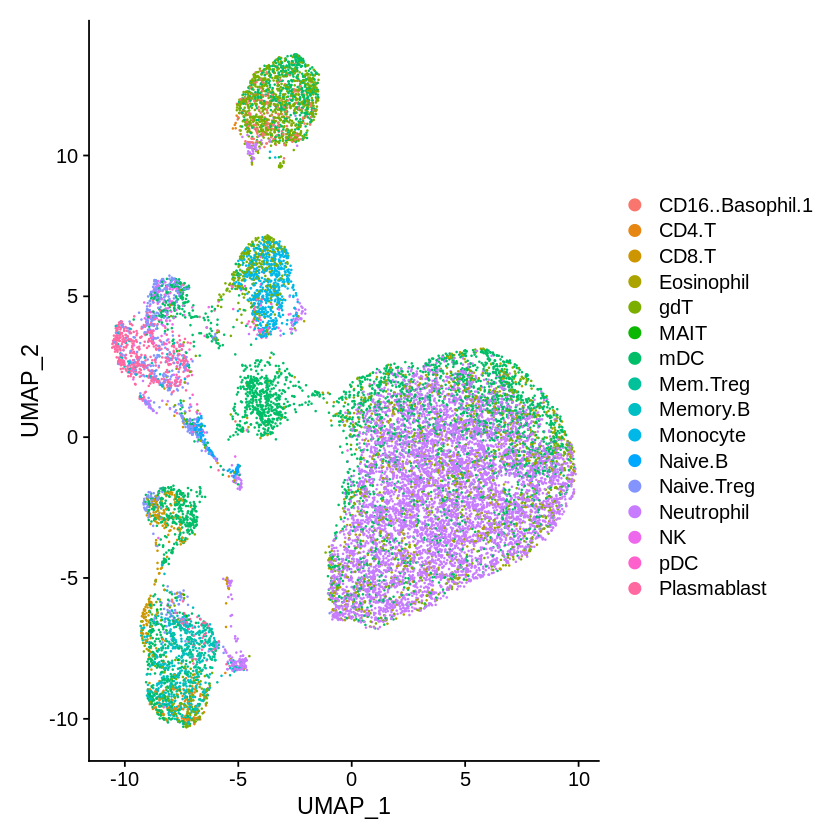

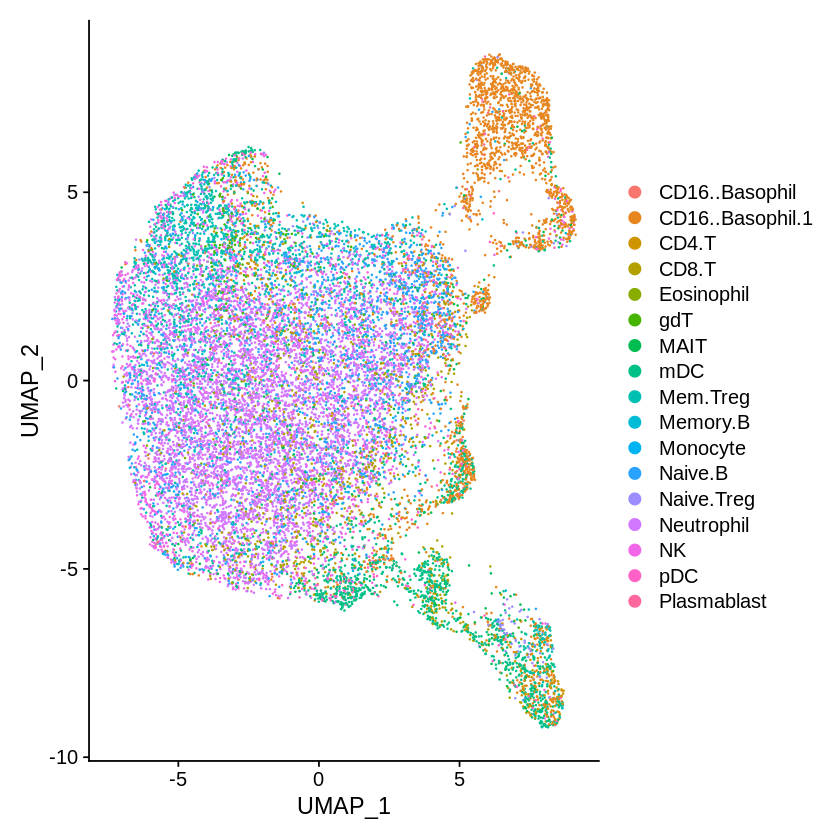

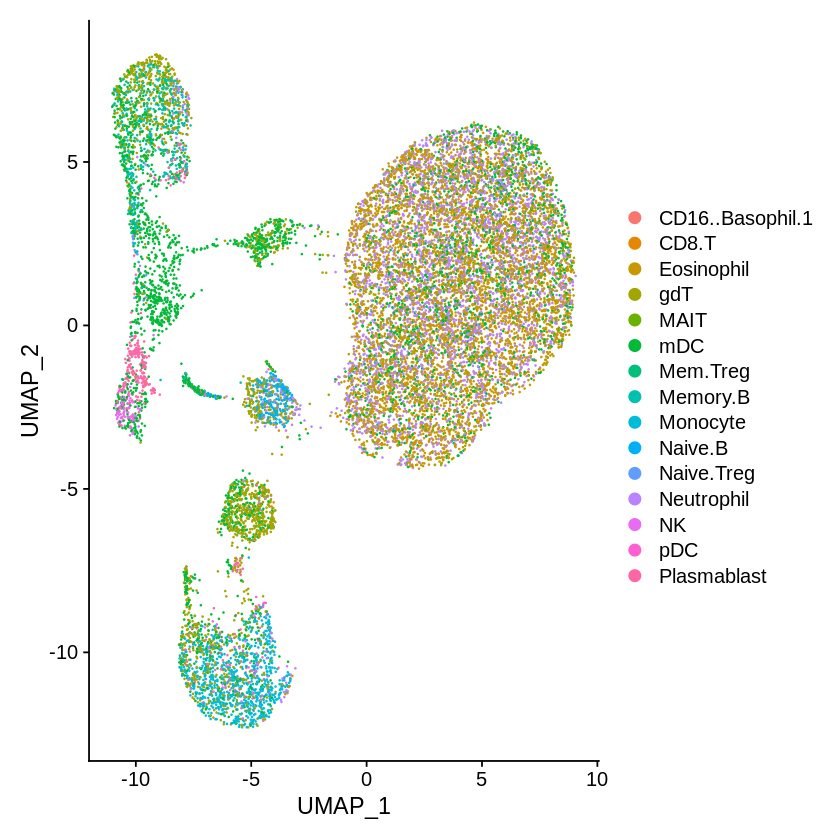

ERROR: Error in gzfile(file, "rb"): invalid 'description' argument


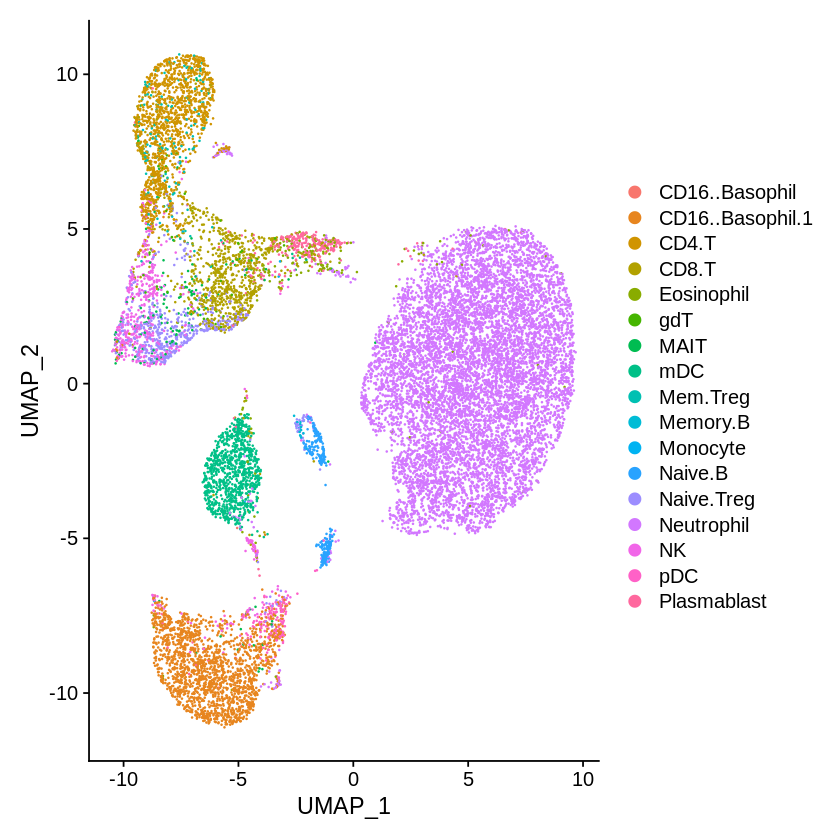

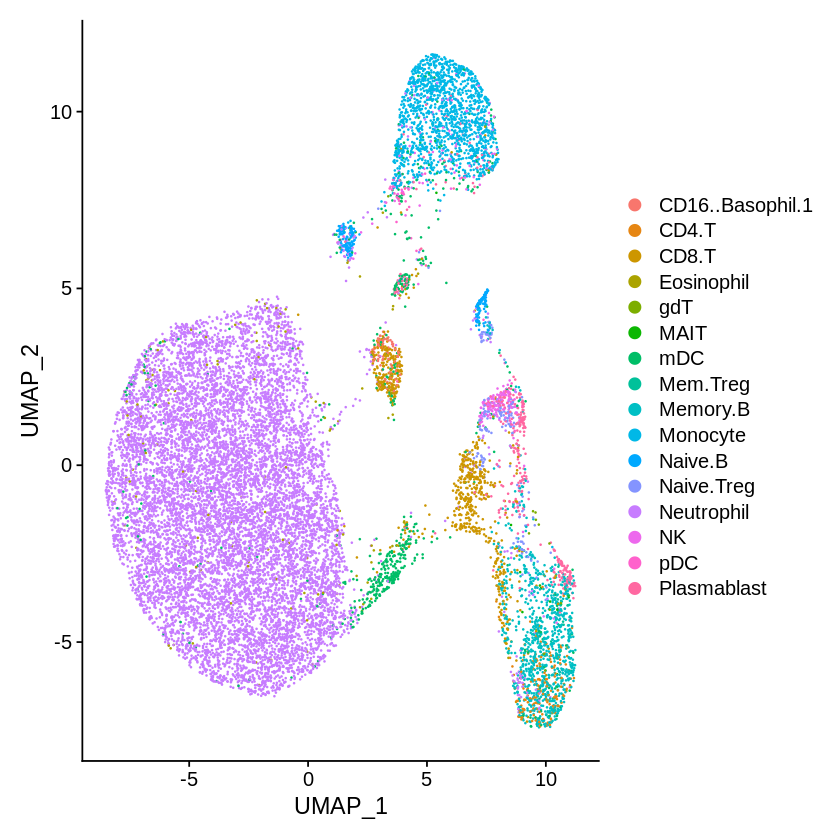

In [143]:
for(i in 1:length(p34_files)) {
    seur <- readRDS(seur_34_files[i])
    rst <- readRDS(rst_34_files[i])
    H_est <- data.frame(rst$H)
    H_est <- cbind(matrix(colnames(A0),ncol=1),H_est)
    celltype_pred <- apply(rst$H, 2, predict_realdata, H_est)
    seur@meta.data$pred <- as.factor(celltype_pred)
    Idents(seur) <- 'pred'
    print(DimPlot(seur, reduction = "umap"))
}


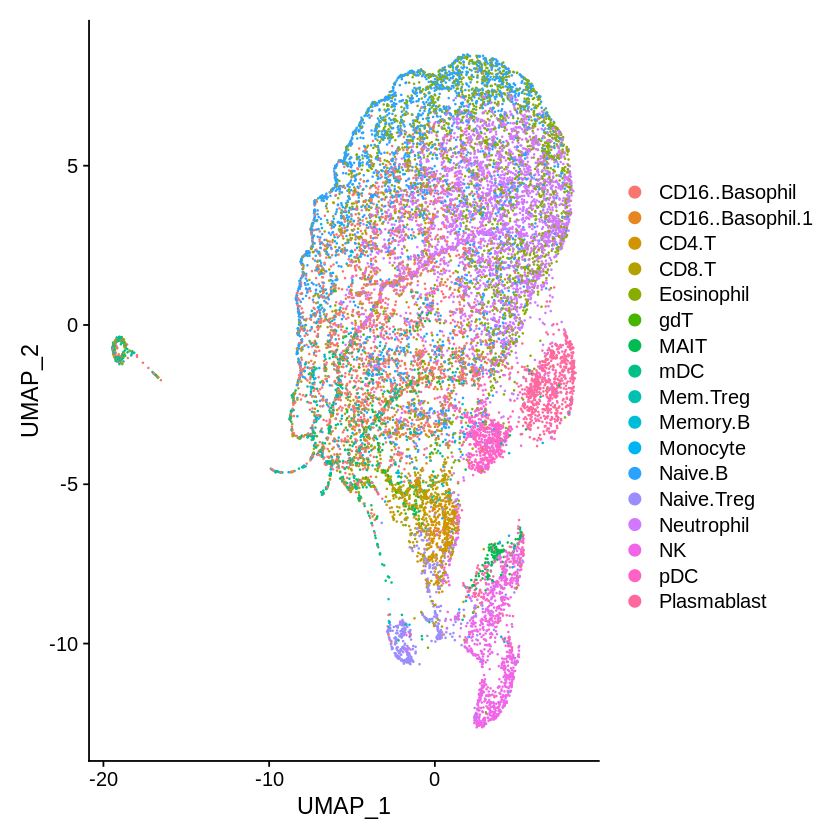

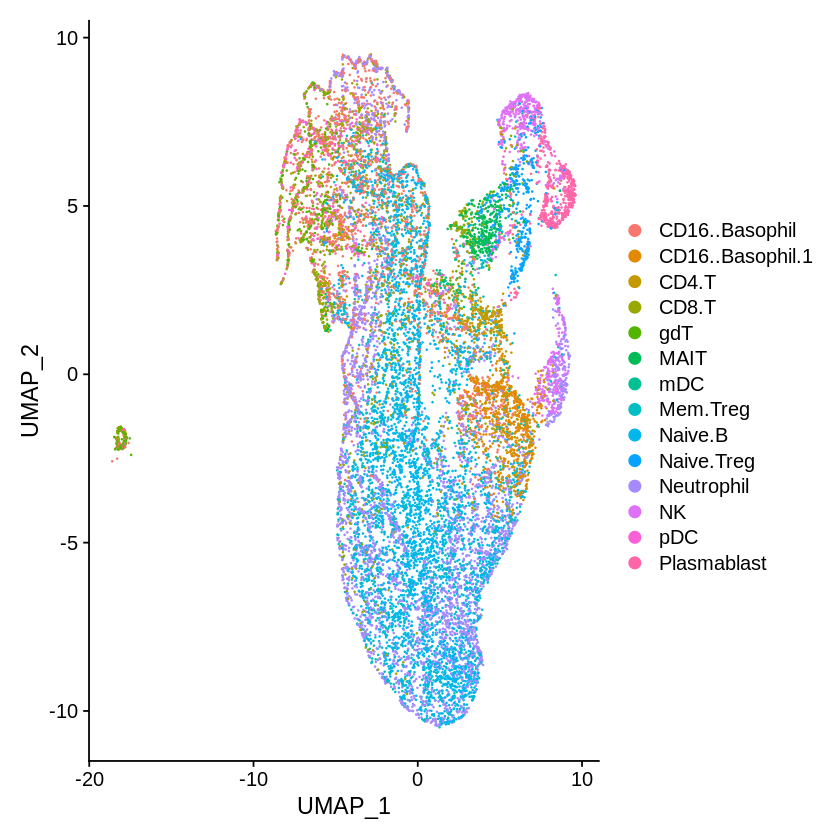

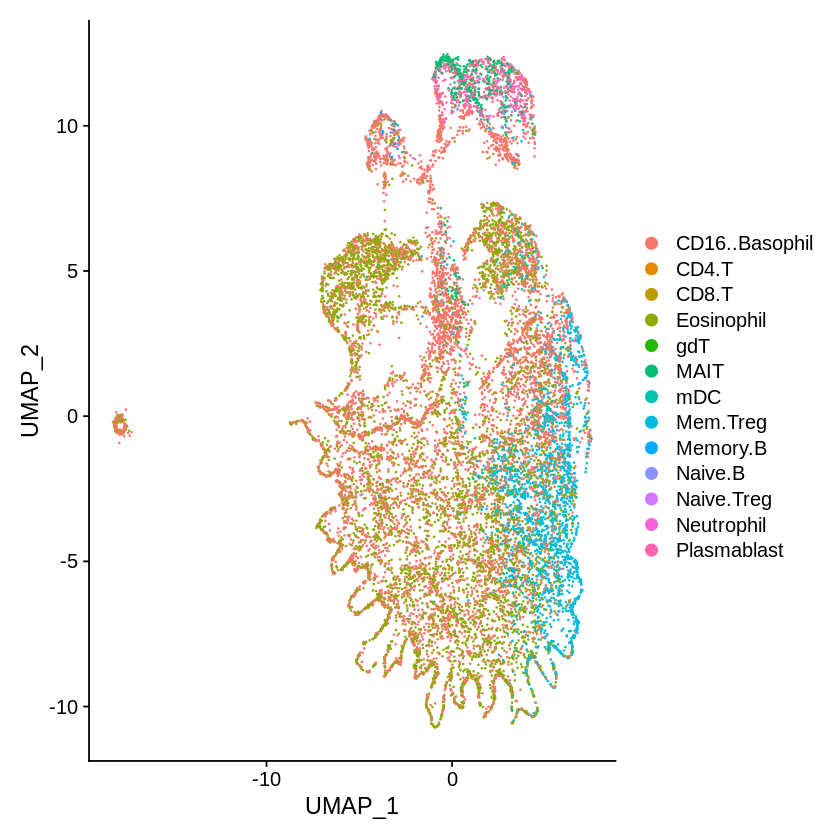

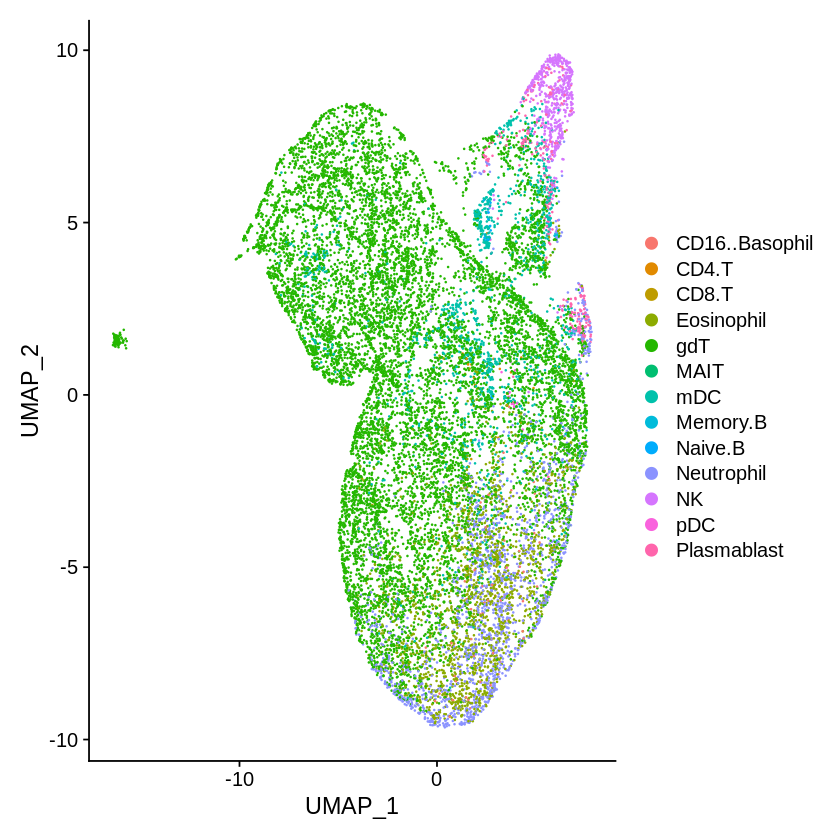

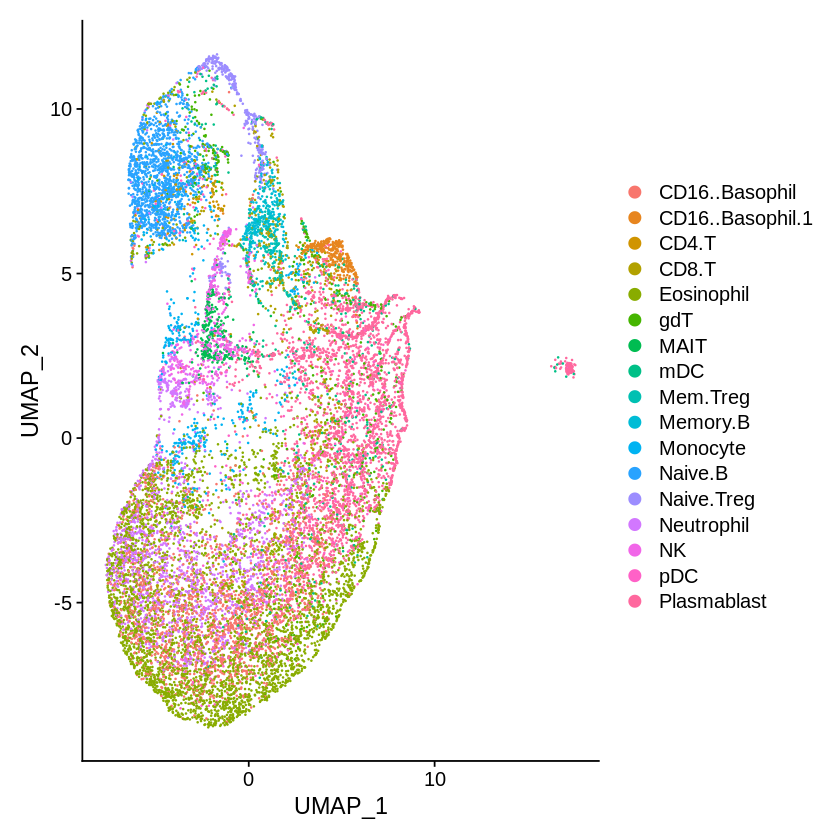

ERROR: Error in gzfile(file, "rb"): invalid 'description' argument


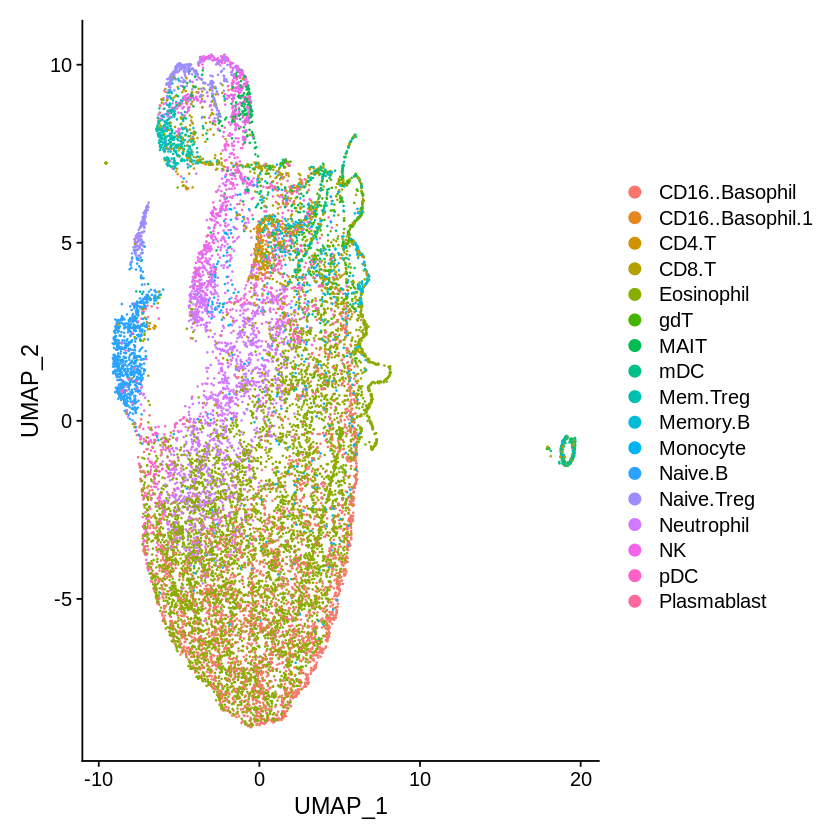

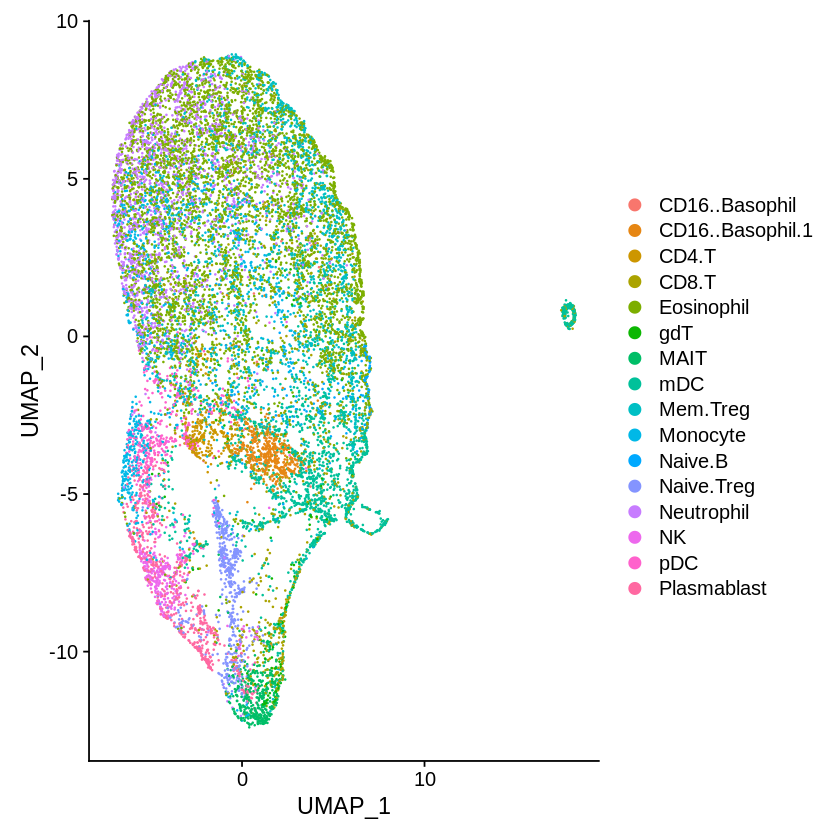

In [144]:
for(i in 1:length(p40_files)) {
    seur <- readRDS(seur_40_files[i])
    rst <- readRDS(rst_40_files[i])
    H_est <- data.frame(rst$H)
    H_est <- cbind(matrix(colnames(A0),ncol=1),H_est)
    celltype_pred <- apply(rst$H, 2, predict_realdata, H_est)
    seur@meta.data$pred <- as.factor(celltype_pred)
    Idents(seur) <- 'pred'
    print(DimPlot(seur, reduction = "umap"))
}

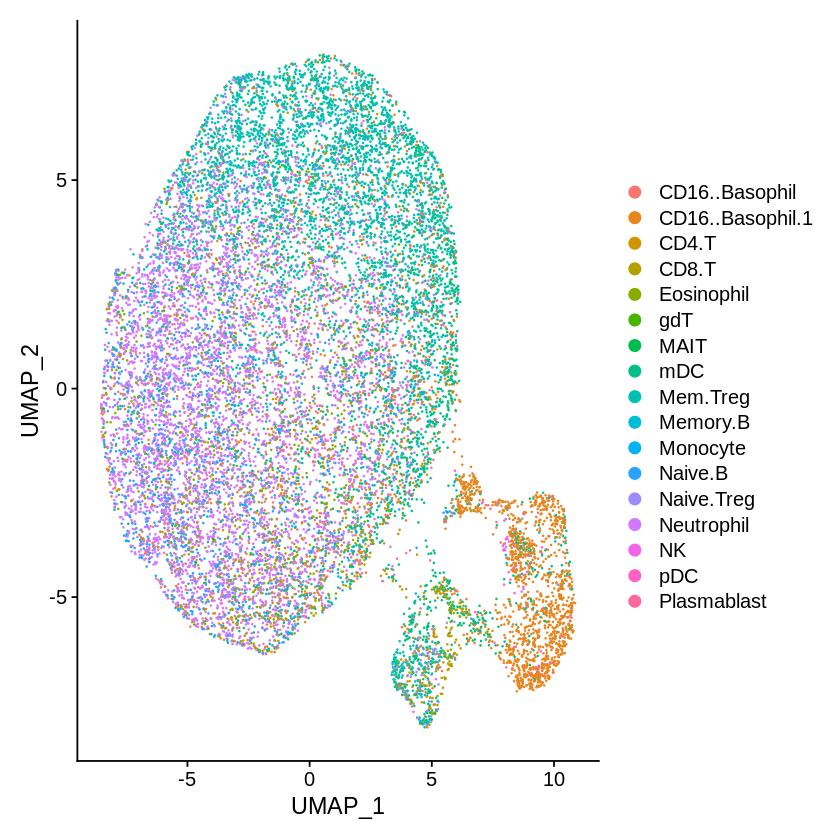

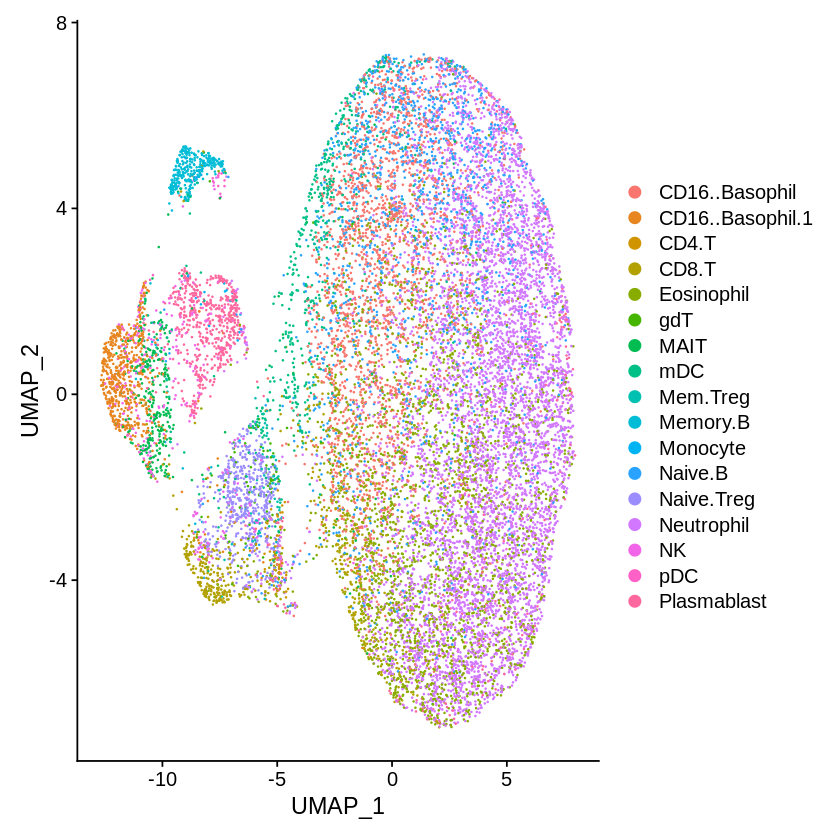

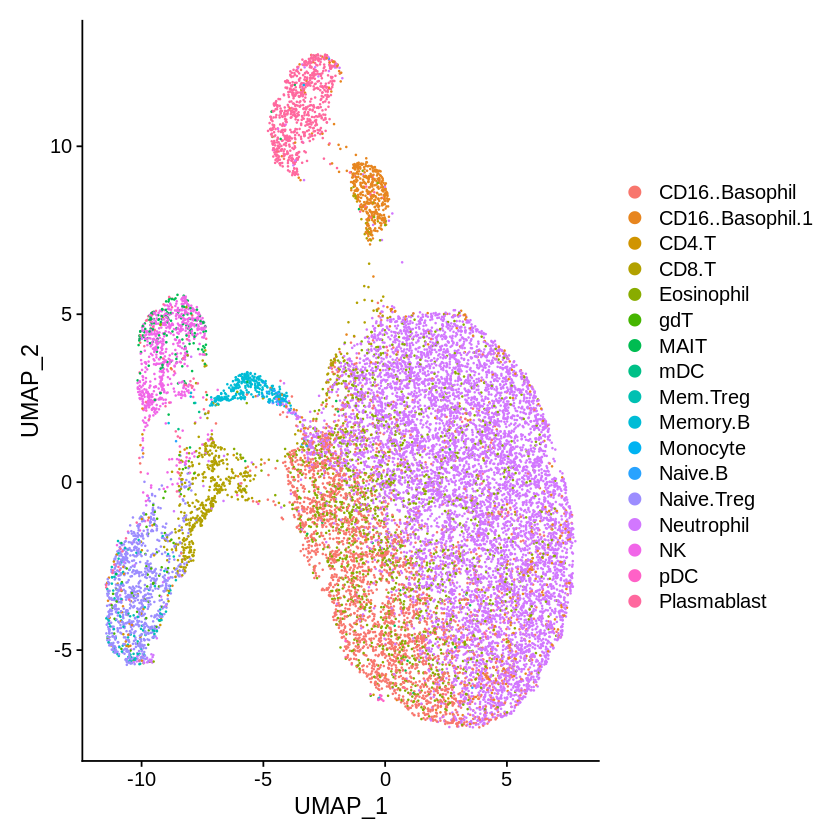

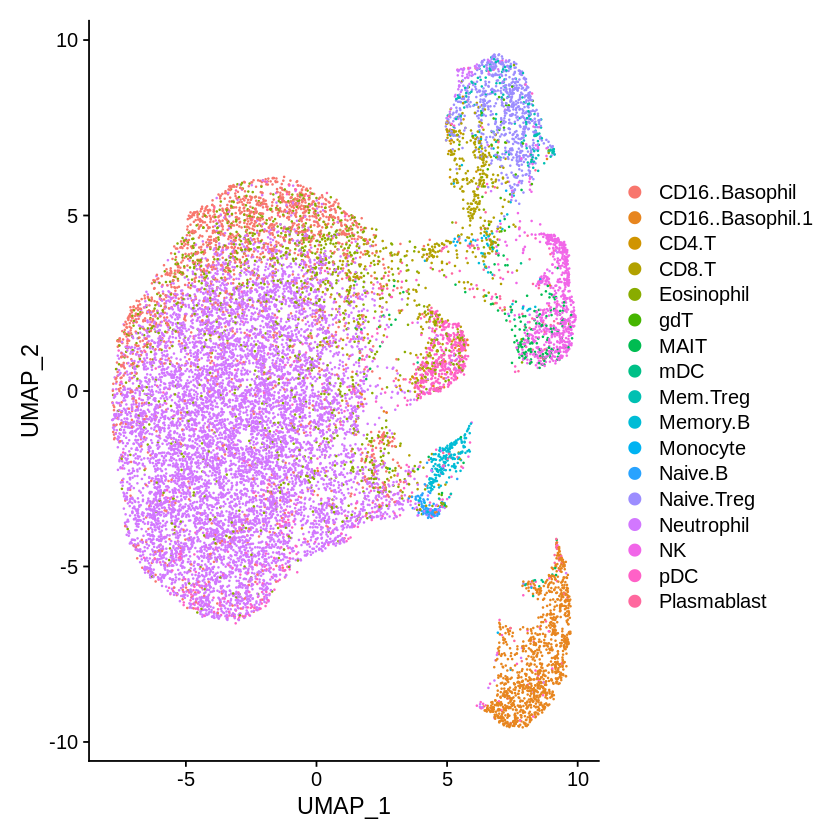

ERROR: Error in gzfile(file, "rb"): invalid 'description' argument


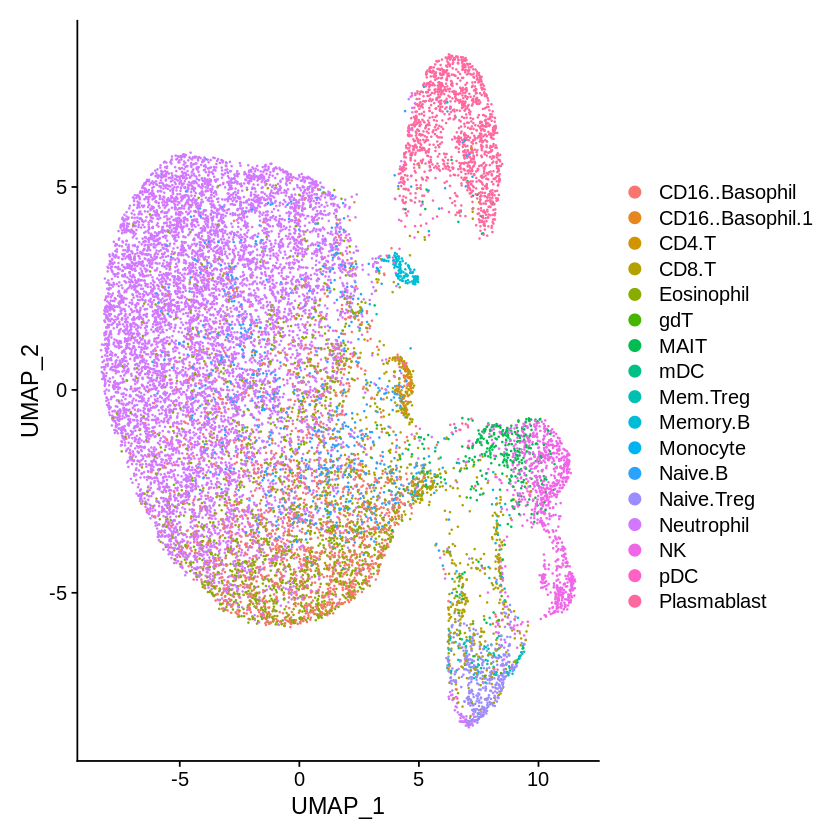

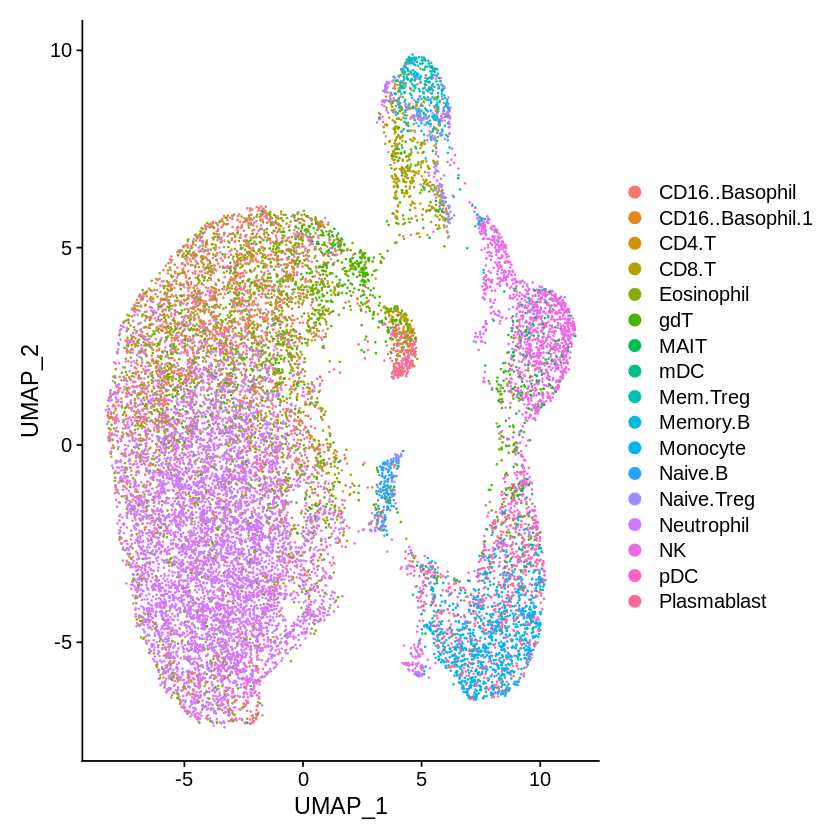

In [146]:
for(i in 1:length(p26_files)) {
    seur <- readRDS(seur_26_files[i])
    rst <- readRDS(rst_26_files[i])
    H_est <- data.frame(rst$H)
    H_est <- cbind(matrix(colnames(A0),ncol=1),H_est)
    celltype_pred <- apply(rst$H, 2, predict_realdata, H_est)
    seur@meta.data$pred <- as.factor(celltype_pred)
    Idents(seur) <- 'pred'
    print(DimPlot(seur, reduction = "umap"))
}

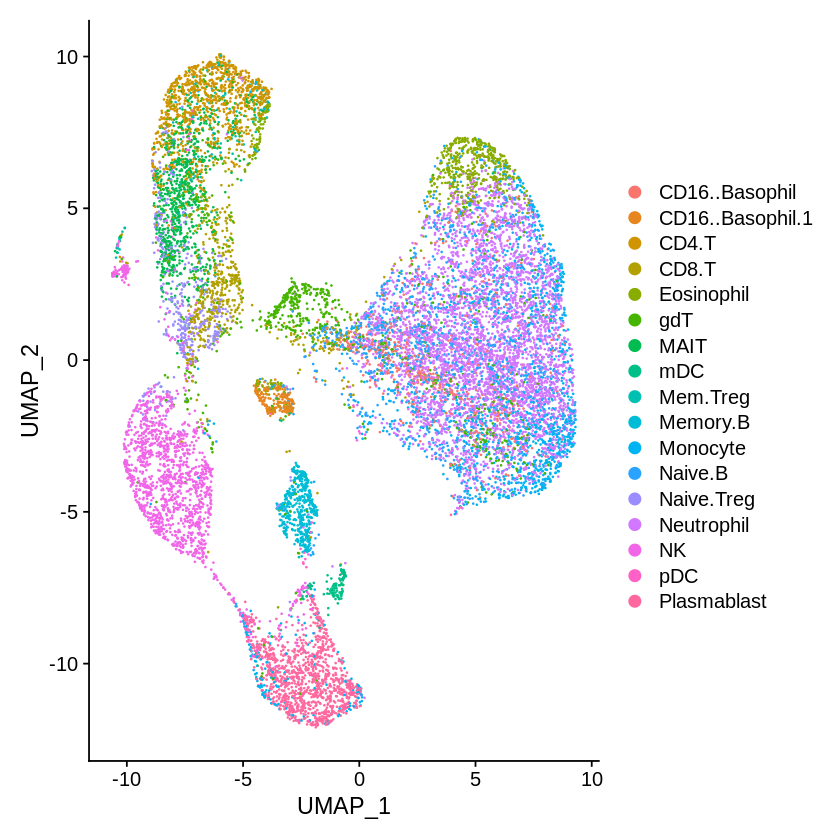

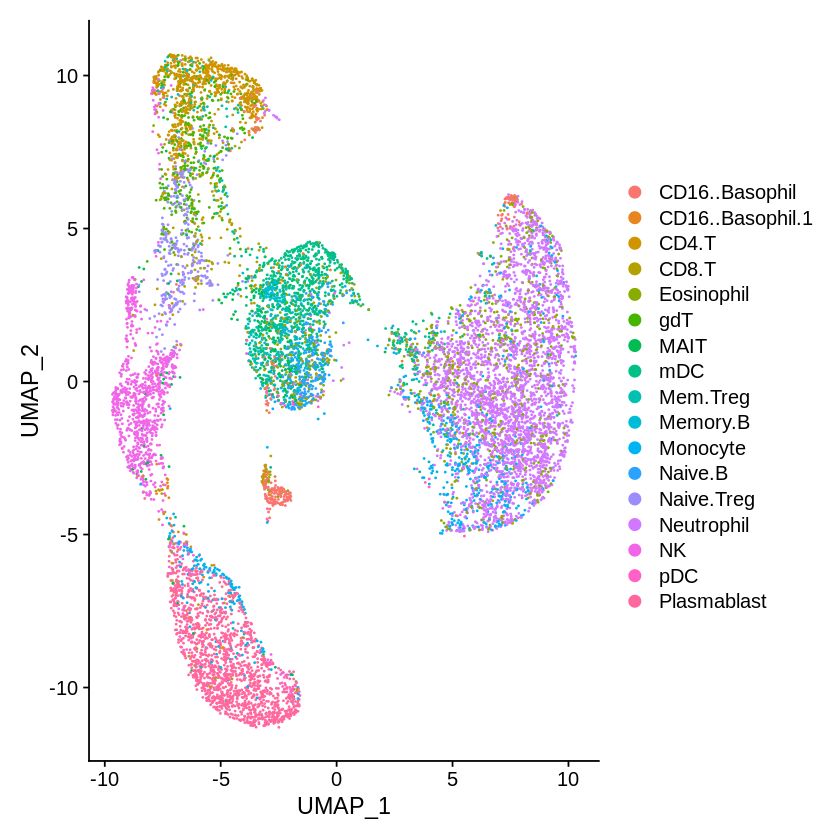

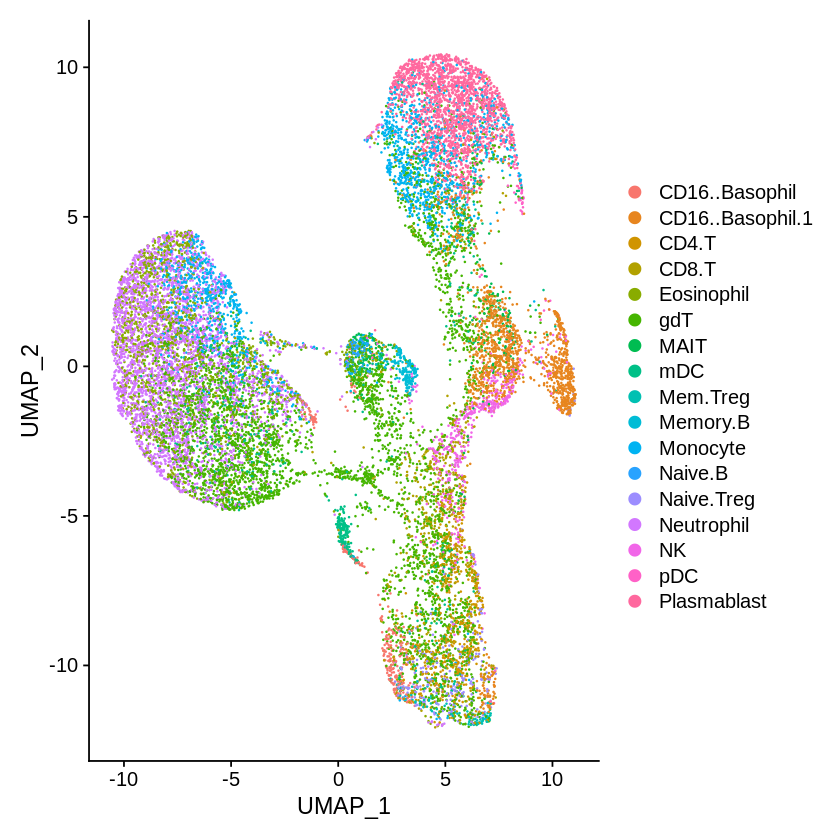

ERROR: Error in gzfile(file, "rb"): invalid 'description' argument


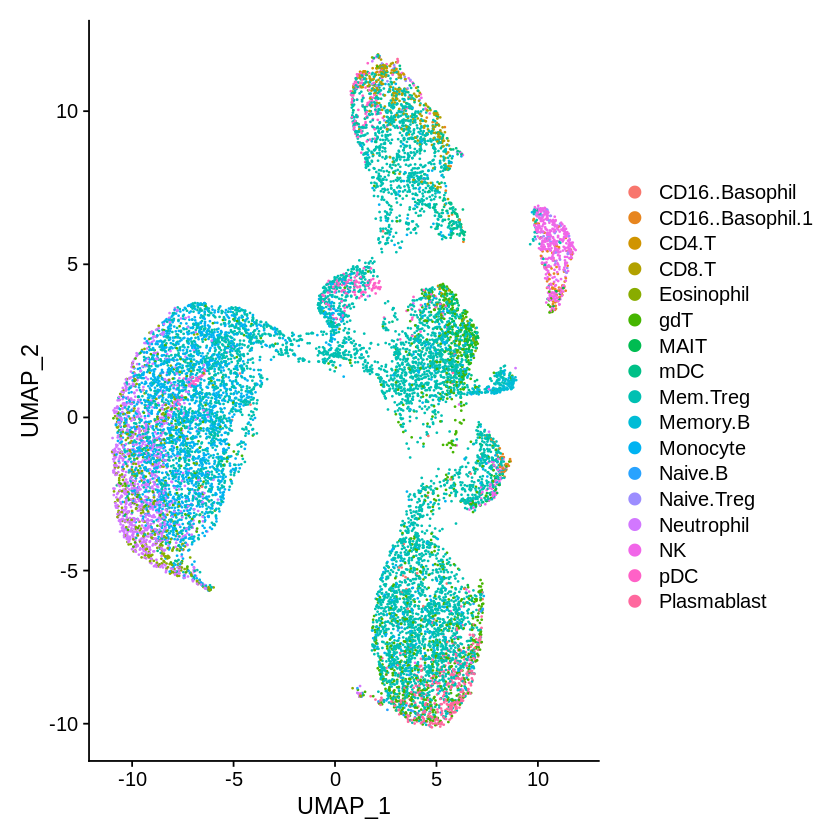

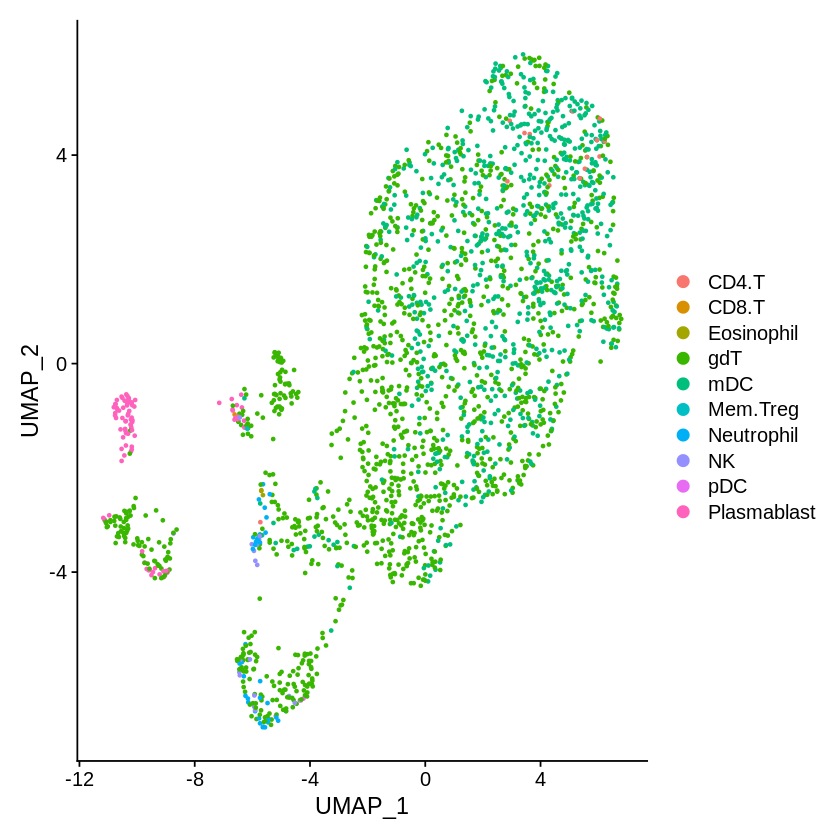

In [147]:
for(i in 1:length(p37_files)) {
    seur <- readRDS(seur_37_files[i])
    rst <- readRDS(rst_37_files[i])
    H_est <- data.frame(rst$H)
    H_est <- cbind(matrix(colnames(A0),ncol=1),H_est)
    celltype_pred <- apply(rst$H, 2, predict_realdata, H_est)
    seur@meta.data$pred <- as.factor(celltype_pred)
    Idents(seur) <- 'pred'
    print(DimPlot(seur, reduction = "umap"))
}

In [154]:
metadata_prop_34

,Subject.ID,Patient_Group,Date,Days_after_First_Day,dir,Days_After_Admission,CD8.T,CD4.T,Mem.Treg,Naive.Treg,⋯,Plasmablast,NK,pDC,mDC,Monocyte,Eosinophil,Neutrophil,MAIT,CD16..Basophil,CD16..Basophil.1
,<fct>,<fct>,<fct>,<int>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
COV-34_20200421,COV-34,ICU,2020-04-21,14,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200421.rds,0,0.000000000,0.000000000,0.000000e+00,0.052098408,⋯,0.000000000,0.000000000,0.0227144026,0.01761782,0.0000000000,0.000000000,0.9075064,0.000000e+00,0.000000e+00,6.292078e-05
COV-34_20200422,COV-34,ICU,2020-04-22,15,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200422.rds,1,0.000000000,0.000000000,0.000000e+00,0.093320907,⋯,0.000000000,0.000000000,0.0277726002,0.02945014,0.0000000000,0.000000000,0.8493942,0.000000e+00,0.000000e+00,6.213110e-05
COV-34_20200423,COV-34,ICU,2020-04-23,16,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200423.rds,2,0.026924578,0.007414014,3.288924e-03,0.017782485,⋯,0.004961258,0.003846368,0.0006131891,0.02681309,0.0000000000,0.000836167,0.8168237,3.456157e-03,1.114889e-03,4.364792e-02
COV-34_20200424_1,COV-34,ICU,2020-04-24,17,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200424.rds,3,0.033834361,0.004251752,5.988383e-05,0.007425594,⋯,0.003533146,0.001556979,0.0000000000,0.16617762,0.0567099826,0.016048865,0.3109767,5.988383e-05,2.634888e-03,4.341577e-02
COV-34_20200430,COV-34,ICU,2020-04-30,23,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200430.rds,9,0.012801250,0.006791274,1.364265e-02,0.035699261,⋯,0.032513973,0.007031673,0.0031852876,0.25410181,0.0368411563,0.038283551,0.3902879,3.605986e-04,0.000000e+00,1.310175e-02
COV-34_20200502,COV-34,ICU,2020-05-02,25,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200502.rds,11,0.001375351,0.000000000,1.793936e-04,0.001554745,⋯,0.021467440,0.008730491,0.0009567661,0.22382348,0.0498714346,0.310470609,0.2030736,2.391915e-04,0.000000e+00,1.195958e-04
COV-34_20200504,COV-34,ICU,2020-05-04,27,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200504.rds,13,0.055723255,0.084339532,8.331321e-03,0.033506399,⋯,0.018051195,0.035377928,0.0091765274,0.05795702,0.0003018595,0.010927312,0.5441922,9.780246e-03,6.037189e-05,1.103598e-01
COV-34_20200506,COV-34,ICU,2020-05-06,29,/gpfs/loomis/pi/zhao2/wd262/shared_data/CyTOF/covid_Rodriguez/expr_trans_singlets/COV-34_20200506.rds,15,0.045862973,0.010670161,1.310371e-03,0.011294147,⋯,0.022276301,0.014351679,0.0025583427,0.04074629,0.0907899663,0.008860602,0.6693498,7.487832e-04,0.000000e+00,5.303881e-03


In [166]:
patients_temp <- names(table(metadata_prop$Subject.ID))[table(metadata_prop$Subject.ID) >= 3]
patients_temp

[1] "COV-24" "COV-26" "COV-29" "COV-34" "COV-35" "COV-37" "COV-39" "COV-40"

In [170]:
## temporal
for(patient in patients_temp) {
    metadata_prop_pat <- metadata_prop[metadata_prop$Subject.ID %in% patient,]
    plt_lst <- list()
    for(i in colnames(ct_cnt_pred)) {
       plt_lst[[i]] <- ggplot(metadata_prop_pat, aes_string(x='Days_After_Admission', y=i)) + 
                        geom_point(shape = 4) +
                        labs(x = 'Days_After_Admission', y = 'Proportion', title = i) + 
                        geom_smooth(method = "loess", se=F) +
                        theme(axis.text=element_text(size=12),
                            axis.title=element_text(size=14,face="bold"),
                            plot.title = element_text(size=14))
    }
    pll <- plot_grid(plotlist = plt_lst, ncol = 4)
    title <- ggdraw() + draw_label(paste("Cell type proportion", patient), fontface='bold')
    pll <- plot_grid(title, pll, ncol=1, rel_heights=c(0.1, 1)) 
    ggsave(paste0('/home/bz234/project/Results/CyTOF/covid-Rodrigeuz/cell_type_prop_', patient, '.png'), pll, 
                  width = 15, height = 20)
}


`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.0602”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used a

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.0602”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.0602”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data v

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1506”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 0.975”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1506”
`geom_smooth()` using formula 'y ~ x'


Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, pa

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, param

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, param

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 3.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.1006”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 3.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, p

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 3.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.1006”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoes

`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 

In [172]:
## temporal
for(patient in patients_temp) {
    metadata_prop_pat_sub <- metadata_prop_sub[metadata_prop_sub$Subject.ID %in% patient,]
    plt_lst_sub <- list()
    for(i in colnames(ct_cnt_pred)) {
       plt_lst_sub[[i]] <- ggplot(metadata_prop_pat_sub, aes_string(x='Days_After_Admission', y=i)) + 
                        geom_point(shape = 4) +
                        labs(x = 'Days_After_Admission', y = 'Proportion', title = i) + 
                        geom_smooth(method = "loess", se=F) +
                        theme(axis.text=element_text(size=12),
                            axis.title=element_text(size=14,face="bold"),
                            plot.title = element_text(size=14))
    }
    pll_sub <- plot_grid(plotlist = plt_lst_sub, ncol = 4)
    title_sub <- ggdraw() + draw_label(paste("Cell type proportion (subsetting)", patient), fontface='bold')
    pll_sub <- plot_grid(title_sub, pll_sub, ncol=1, rel_heights=c(0.1, 1)) 
    ggsave(paste0('/home/bz234/project/Results/CyTOF/covid-Rodrigeuz/cell_type_prop_', patient, '_sub.png'), pll_sub, 
                  width = 15, height = 20)
}



`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.0602”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used a

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.0602”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.015”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.0602”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data v

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1506”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 0.975”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1506”
`geom_smooth()` using formula 'y ~ x'


Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, pa

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, param

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, param

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 3.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.1006”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 3.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, p

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 3.025”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 4.1006”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.025”
Warning message in simpleLoes

`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 2.02”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 9.1204”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 

In [195]:
metadata_prop_temp <- metadata_prop[metadata_prop$Patient_Group %in% c('ICU', 'Non-ICU'),]
metadata_prop_temp_sub <- metadata_prop_sub[metadata_prop_sub$Patient_Group %in% c('ICU', 'Non-ICU'),]

In [197]:
plt_lst <- list()
for(i in colnames(ct_cnt_pred)) {
    plt_lst[[i]] <- ggplot(metadata_prop_temp, aes_string(x='Days_After_Admission', y=i, color = 'Patient_Group')) + 
                        geom_point(shape = 4) +
                        labs(x = 'Days_After_Admission', y = 'Proportion', title = i) + 
                        geom_smooth(method = "loess") +
                        theme(axis.text=element_text(size=12),
                            axis.title=element_text(size=14,face="bold"),
                            plot.title = element_text(size=14))
}
pll <- plot_grid(plotlist = plt_lst, ncol = 4)
title <- ggdraw() + draw_label("Cell type proportion", fontface='bold')
pll <- plot_grid(title, pll, ncol=1, rel_heights=c(0.1, 1)) 
ggsave(paste0('/home/bz234/project/Results/CyTOF/covid-Rodrigeuz/cell_type_prop_temporal.png'), pll, 
                  width = 20, height = 20)

`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 6.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 81.812”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“span too small.   fewer data values than degrees of freedom.”
Warning message in predLoess(object$y, object$x, newx = if (is.n

Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“neighborhood radius 6.045”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“reciprocal condition number  0”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“There are other near singularities as well. 81.812”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.045”
Warning message in simpleLoess(y, x, w, span,

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 81.812”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“span too small.   fewer data values than degrees of freedom.”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“pseudoinverse used at -0.045”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“neighborhood radius 6.045”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object

Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“There are other near singularities as well. 81.812”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 6.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 81.812”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdat

In [192]:
plt_lst_sub <- list()
for(i in colnames(ct_cnt_pred)) {
    plt_lst_sub[[i]] <- ggplot(metadata_prop_temp_sub, aes_string(x='Days_After_Admission', y=i, color = 'Patient_Group')) + 
                        geom_point(shape = 4) +
                        labs(x = 'Days_After_Admission', y = 'Proportion', title = i) + 
                        geom_smooth(method = "loess") +
                        theme(axis.text=element_text(size=12),
                            axis.title=element_text(size=14,face="bold"),
                            plot.title = element_text(size=14))
}
pll_sub <- plot_grid(plotlist = plt_lst_sub, ncol = 4)
title_sub <- ggdraw() + draw_label("Cell type proportion (subsetting)", fontface='bold')
pll_sub <- plot_grid(title_sub, pll_sub, ncol=1, rel_heights=c(0.1, 1)) 
ggsave(paste0('/home/bz234/project/Results/CyTOF/covid-Rodrigeuz/cell_type_prop_temporal_sub.png'), pll_sub, 
                  width = 20, height = 20)

`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 6.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 81.812”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“span too small.   fewer data values than degrees of freedom.”
Warning message in predLoess(object$y, object$x, newx = if (is.n

Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“neighborhood radius 6.045”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“reciprocal condition number  0”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“There are other near singularities as well. 81.812”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.045”
Warning message in simpleLoess(y, x, w, span,

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 81.812”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“span too small.   fewer data values than degrees of freedom.”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“pseudoinverse used at -0.045”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“neighborhood radius 6.045”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object

Warning message in predLoess(object$y, object$x, newx = if (is.null(newdata)) object$x else if (is.data.frame(newdata)) as.matrix(model.frame(delete.response(terms(object)), :
“There are other near singularities as well. 81.812”
`geom_smooth()` using formula 'y ~ x'

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“span too small.   fewer data values than degrees of freedom.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -0.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 6.045”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 81.812”
Warning message in predLoess(object$y, object$x, newx = if (is.null(newdat

In [184]:
print(pll_sub[[1]])

list()
attr(,"class")
[1] "waiver"
